In [1]:
!pip install -U datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.5/491.5 kB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 20.6 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.2
    Uninstalling fsspec-2025.3.2:
      Successfully uninstalled fsspec-2025.3.2
  Attempting uninstall: datasets
    Found existing installation: datasets 2.14.4
    Uninstalling datasets-2.14.4:
      Successfully uninstalled datasets-2.14.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.2 requires fsspec==2025.3.2, but you have fsspec 2025.3.0 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; pl

In [1]:
from datasets import load_dataset

dataset = load_dataset("artovv/musicgen-mystyle", split="train")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [10]:
from IPython.display import Audio

Audio(dataset[12]["audio"]["array"], rate=dataset[12]["audio"]["sampling_rate"])

In [9]:
print(dataset[12]["metadata"])

F#, acousticguitar, 129 bpm, Pop, Indie Pop, groovy


In [11]:
from transformers import (
    AutoProcessor,
    AutoModelForTextToWaveform,
)

processor = AutoProcessor.from_pretrained("facebook/musicgen-melody")
model = AutoModelForTextToWaveform.from_pretrained("facebook/musicgen-melody")

model.freeze_text_encoder()
model.freeze_audio_encoder()

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [12]:
from transformers import AutoFeatureExtractor
from datasets import Audio

instance_prompt = "my_style"


audio_encoder_feature_extractor = AutoFeatureExtractor.from_pretrained(
    model.config.audio_encoder._name_or_path,
)


dataset_sampling_rate = dataset[0]["audio"]["sampling_rate"]

if dataset_sampling_rate != audio_encoder_feature_extractor.sampling_rate:
    dataset = dataset.cast_column(
        "audio",
        Audio(
            sampling_rate=audio_encoder_feature_extractor.sampling_rate
        ),
    )



def prepare_audio_features(batch):
    metadata = batch["metadata"]
    metadata = f"{instance_prompt}, {metadata}"
    batch["input_ids"] = processor.tokenizer(metadata)["input_ids"]

    # load audio
    target_sample = batch["audio"]
    labels = audio_encoder_feature_extractor(
        target_sample["array"], sampling_rate=target_sample["sampling_rate"]
    )
    batch["labels"] = labels["input_values"]

    batch["target_length"] = len(target_sample["array"].squeeze())
    return batch


dataset = dataset.map(
    prepare_audio_features,
    remove_columns=dataset.column_names,
    num_proc=2,
    desc="preprocess datasets",
)

In [13]:
import torch

audio_decoder = model.audio_encoder
num_codebooks = model.decoder.config.num_codebooks
audio_encoder_pad_token_id = model.config.decoder.pad_token_id

pad_labels = torch.ones((1, 1, num_codebooks, 1)) * audio_encoder_pad_token_id

if torch.cuda.device_count() == 1:
    audio_decoder.to("cuda")

def apply_audio_decoder(batch):

    with torch.no_grad():
        labels = audio_decoder.encode(
            torch.tensor(batch["labels"]).to(audio_decoder.device)
        )["audio_codes"]

    labels = torch.cat(
        [pad_labels.to(labels.device).to(labels.dtype), labels], dim=-1
    )

    labels, delay_pattern_mask = model.decoder.build_delay_pattern_mask(
        labels.squeeze(0),
        audio_encoder_pad_token_id,
        labels.shape[-1] + num_codebooks,
    )

    labels = model.decoder.apply_delay_pattern_mask(labels, delay_pattern_mask)

    batch["labels"] = labels[:, 1:].cpu()
    return batch

dataset = dataset.map(
    apply_audio_decoder,
    num_proc=1,
    desc="Apply encodec",
)

Parameter 'function'=<function apply_audio_decoder at 0x7ab41bb74c20> of the transform datasets.arrow_dataset.Dataset._map_single couldn't be hashed properly, a random hash was used instead. Make sure your transforms and parameters are serializable with pickle or dill for the dataset fingerprinting and caching to work. If you reuse this transform, the caching mechanism will consider it to be different from the previous calls and recompute everything. This warning is only showed once. Subsequent hashing failures won't be showed.


Apply encodec:   0%|          | 0/69 [00:00<?, ? examples/s]

In [14]:
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments
from dataclasses import dataclass

class MusicgenTrainer(Seq2SeqTrainer):
    def _pad_tensors_to_max_len(self, tensor, max_length):
        if self.tokenizer is not None and hasattr(self.tokenizer, "pad_token_id"):
            pad_token_id = (
                self.tokenizer.pad_token_id
                if self.tokenizer.pad_token_id is not None
                else self.tokenizer.eos_token_id
            )
        else:
            if self.model.config.pad_token_id is not None:
                pad_token_id = self.model.config.pad_token_id
            else:
                raise ValueError(
                    "Pad_token_id must be set in the configuration of the model, in order to pad tensors"
                )

        padded_tensor = pad_token_id * torch.ones(
            (tensor.shape[0], max_length, tensor.shape[2]),
            dtype=tensor.dtype,
            device=tensor.device,
        )
        length = min(max_length, tensor.shape[1])
        padded_tensor[:, :length] = tensor[:, :length]
        return padded_tensor


@dataclass
class DataCollatorMusicGenWithPadding:
    processor: AutoProcessor

    def __call__(
        self, features
    ):
        labels = [
            torch.tensor(feature["labels"]).transpose(0, 1) for feature in features
        ]

        labels = torch.nn.utils.rnn.pad_sequence(
            labels, batch_first=True, padding_value=-100
        )

        input_ids = [{"input_ids": feature["input_ids"]} for feature in features]
        input_ids = self.processor.tokenizer.pad(input_ids, return_tensors="pt")

        batch = {"labels": labels, **input_ids}

        return batch

data_collator = DataCollatorMusicGenWithPadding(
    processor=processor,
)



In [15]:
from huggingface_hub import notebook_login
notebook_login()

##fourier ft

In [82]:
from transformers import (
    AutoProcessor,
    AutoModelForTextToWaveform,
)

processor = AutoProcessor.from_pretrained("facebook/musicgen-melody")
model = AutoModelForTextToWaveform.from_pretrained("facebook/musicgen-melody")

model.freeze_text_encoder()
model.freeze_audio_encoder()

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torch
import torch.nn as nn
import torch.nn.functional as F

class FourierFTWrapper(nn.Module):
    def __init__(self, base_layer: nn.Linear, n: int = 100, alpha: float = 300.0,
                 freq_bias: str = "middle", bandwidth: float = 0.2):
        super().__init__()
        self.base = base_layer
        self.alpha = alpha
        self.d1, self.d2 = base_layer.weight.shape
        self.n = min(n, self.d1 * self.d2)

        # Инициализация спектральной матрицы с bias
        E = self._sample_entries_with_frequency_bias(freq_bias, bandwidth)
        self.register_buffer("E", E)

        # Обучаемые спектральные коэффициенты
        self.delta_W = nn.Parameter(torch.randn(self.n))

        # Заморозка base-слоя
        for param in self.base.parameters():
            param.requires_grad = False

    def _sample_entries_with_frequency_bias(self, freq_bias, bandwidth):
        bias_map = {
            "low": 0.1,
            "middle": 0.5,
            "high": 0.9,
            "none": None  # равномерное распределение
        }
        fc = bias_map.get(freq_bias, 0.5)
        d1, d2 = self.d1, self.d2

        # Координаты в частотной области
        u = torch.arange(d1).unsqueeze(1).expand(d1, d2)
        v = torch.arange(d2).unsqueeze(0).expand(d1, d2)

        if fc is None:
            prob = torch.ones(d1, d2)
        else:
            # Центр в частотной матрице
            center_u = d1 * fc
            center_v = d2 * fc
            D = ((u - center_u) ** 2 + (v - center_v) ** 2).sqrt()
            DW = bandwidth * max(d1, d2)
            prob = torch.exp(-((D - fc * max(d1, d2)) / DW) ** 2)

        # Нормализация
        prob = prob / prob.sum()
        prob_flat = prob.flatten()

        # Сэмплирование n индексов
        indices = torch.multinomial(prob_flat, self.n, replacement=False)
        E0 = indices // d2
        E1 = indices % d2
        return torch.stack([E0, E1], dim=0)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        h = self.base(x)

        F = torch.zeros(self.d1, self.d2, dtype=torch.float32, device=x.device)
        F[self.E[0], self.E[1]] = self.delta_W

        delta_W_matrix = torch.fft.ifft2(F).real * self.alpha

        if x.shape[-1] != delta_W_matrix.shape[0]:
            raise ValueError(f"[FourierFT] Shape mismatch: x={x.shape}, delta={delta_W_matrix.shape}")

        h += torch.einsum("...d,dc->...c", x, delta_W_matrix)
        return h


def test_fourierft_gradient():
    torch.manual_seed(42)

    base_layer = nn.Linear(64, 64, bias=False)
    fourier_layer = FourierFTWrapper(base_layer, n=10, alpha=300.0)

    optimizer = torch.optim.AdamW([p for p in fourier_layer.parameters() if p.requires_grad], lr=1e-3)

    x = torch.randn(2, 64, requires_grad=True)
    target = torch.randn(2, 64)


    y = fourier_layer(x)
    loss = F.mse_loss(y, target)
    loss.backward()

    print(f"Loss: {loss.item()}")
    print(f"delta_W requires_grad: {fourier_layer.delta_W.requires_grad}")
    print(f"delta_W.grad is None? {fourier_layer.delta_W.grad is None}")
    print(f"delta_W.grad norm: {fourier_layer.delta_W.grad.norm().item():.6f}" if fourier_layer.delta_W.grad is not None else "No grad")

test_fourierft_gradient()


Loss: 3.386134147644043
delta_W requires_grad: True
delta_W.grad is None? False
delta_W.grad norm: 1.977579


In [83]:
def inject_fourierft(model, n=1000, alpha=300.0, freq_bias="middle", bandwidth=0.2):
    total = 0
    for i, layer in enumerate(model.decoder.model.decoder.layers):
        for name in ["v_proj", "q_proj"]:
            target = getattr(layer.self_attn, name)
            if isinstance(target, nn.Linear):
                ft = FourierFTWrapper(
                    target,
                    n=n,
                    alpha=alpha,
                    freq_bias=freq_bias,  # "low", "middle", "high", "none"
                    bandwidth=bandwidth
                )
                setattr(layer.self_attn, name, ft)
                print(f"FourierFTWithBias вставлен в layer[{i}].self_attn.{name}")
                total += 1
    print(f"Всего вставлено адаптеров: {total}")


In [19]:
def freeze_all_except_fourier(model):
    frozen = 0
    trainable = 0
    for name, param in model.named_parameters():
        if "delta_W" in name:
            param.requires_grad = True
            trainable += param.numel()
        else:
            param.requires_grad = False
            frozen += param.numel()
    print(f"Заморожено параметров: {frozen:,}, обучаемо (Fourier): {trainable:,}")


In [84]:
inject_fourierft(model, n=5000, alpha=200.0, freq_bias="none")
freeze_all_except_fourier(model)


FourierFTWithBias вставлен в layer[0].self_attn.v_proj
FourierFTWithBias вставлен в layer[0].self_attn.q_proj
FourierFTWithBias вставлен в layer[1].self_attn.v_proj
FourierFTWithBias вставлен в layer[1].self_attn.q_proj
FourierFTWithBias вставлен в layer[2].self_attn.v_proj
FourierFTWithBias вставлен в layer[2].self_attn.q_proj
FourierFTWithBias вставлен в layer[3].self_attn.v_proj
FourierFTWithBias вставлен в layer[3].self_attn.q_proj
FourierFTWithBias вставлен в layer[4].self_attn.v_proj
FourierFTWithBias вставлен в layer[4].self_attn.q_proj
FourierFTWithBias вставлен в layer[5].self_attn.v_proj
FourierFTWithBias вставлен в layer[5].self_attn.q_proj
FourierFTWithBias вставлен в layer[6].self_attn.v_proj
FourierFTWithBias вставлен в layer[6].self_attn.q_proj
FourierFTWithBias вставлен в layer[7].self_attn.v_proj
FourierFTWithBias вставлен в layer[7].self_attn.q_proj
FourierFTWithBias вставлен в layer[8].self_attn.v_proj
FourierFTWithBias вставлен в layer[8].self_attn.q_proj
FourierFTW

In [21]:
trainable_parameters = [p for n, p in model.named_parameters() if p.requires_grad]
trainable_names = [n for n, p in model.named_parameters() if p.requires_grad]

In [22]:
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Всего параметров в модели: {total_params:,}")
print(f"Обучаемых параметров: {trainable_params:,}")
print(f"Доля обучаемых: {100 * trainable_params / total_params:.2f}%")

Всего параметров в модели: 1,552,618,818
Обучаемых параметров: 480,000
Доля обучаемых: 0.03%


In [21]:
gc.collect()
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

In [23]:
import torch
import gc
import os
import soundfile as sf
from tqdm import tqdm
from torch.utils.data import DataLoader
from torch import autocast, GradScaler
from IPython.display import Audio, display
from torch import autocast

num_epochs = 30
batch_size = 2
lr = 3e-3
grad_accum_steps = 2
prompt = "my_style, 80s groovy dance-pop with drums and guitar"
guidance_scale = 3.0
gen_dir = "./intermediate_audio"
os.makedirs(gen_dir, exist_ok=True)
losses = []

scaler = GradScaler()
model.train().cuda()
compiled_model = model  # просто alias


dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=data_collator, num_workers=8, pin_memory=True, persistent_workers=True)
optimizer = torch.optim.AdamW(
    [p for p in compiled_model.parameters() if p.requires_grad],
    lr=lr,
    betas=(0.9, 0.99),
    weight_decay=0.1,
)


sample_batch = next(iter(dataloader))
sample_batch = {k: v.to(compiled_model.device) for k, v in sample_batch.items()}
compiled_model.eval()
with torch.no_grad():
    with autocast("cuda"):
        outputs_before = compiled_model(**sample_batch).logits.detach().cpu()
print("Сохранено outputs_before")


for epoch in range(num_epochs):
    print(f"\nЭпоха {epoch + 1}/{num_epochs}")
    total_loss = 0.0
    compiled_model.train()
    gc.collect()
    torch.cuda.empty_cache()

    for step, batch in enumerate(tqdm(dataloader)):
        batch = {k: v.to(compiled_model.device) for k, v in batch.items()}

        with autocast(dtype=torch.float16, device_type="cuda"):
            outputs = compiled_model(**batch)
            loss = outputs.loss / grad_accum_steps

        scaler.scale(loss).backward()

        if (step + 1) % grad_accum_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad(set_to_none=True)

        total_loss += loss.item() * grad_accum_steps

        if step % 10 == 0:
            print(f"Step {step} | Loss: {loss.item() * grad_accum_steps:.4f}")

    print(f"Средний loss: {total_loss / len(dataloader):.6f}")
    losses.append(total_loss / len(dataloader))

    trainable = [(n, p) for n, p in compiled_model.named_parameters() if p.requires_grad]
    only_fourier = all("delta_W" in name for name, _ in trainable)


    total, no_grad, grad_norm_sum = 0, 0, 0.0
    for name, param in compiled_model.named_parameters():
        if "delta_W" in name:
            total += param.numel()
            if param.grad is None:
                #print(f"{name}: градиент отсутствует")
                no_grad += param.numel()
            else:
                norm = param.grad.norm().item()
                grad_norm_sum += norm
                #print(f"{name}: grad.norm = {norm:.6f}")
    # print(f"Всего delta_W параметров: {total:,}")
    # print(f"Без градиента: {no_grad:,}")
    print(f"Сумма grad.norm: {grad_norm_sum:.6f}")

    compiled_model.eval()
    torch.cuda.empty_cache()
    try:
        inputs = processor(text=[prompt], padding=True, return_tensors="pt").to(compiled_model.device)
        with torch.no_grad():
            audio_values = compiled_model.generate(
                **inputs,
                do_sample=True,
                guidance_scale=guidance_scale,
                max_new_tokens=256
            )

        audio = audio_values.cpu().numpy().squeeze()
        path = os.path.join(gen_dir, f"gen_after_epoch_{epoch + 1}.wav")
        sf.write(path, audio, samplerate=32000)
        print(f" Аудио сохранено: {path}")
        display(Audio(audio, rate=32000))

        #compiled_model.eval()
        with torch.no_grad():
            with autocast(dtype=torch.float16, device_type="cuda"):
                outputs_after = compiled_model(**sample_batch).logits.detach().cpu()

        delta = (outputs_before - outputs_after).pow(2).mean().sqrt().item()
        print(f"\nИзменение выходов модели после эпохи {epoch + 1}: L2 = {delta:.6f}")

    except Exception as e:
        print(f"Ошибка генерации: {e}")

    finally:
        compiled_model.train()
        gc.collect()
        torch.cuda.empty_cache()


You're using a T5TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
You're using a T5TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
You're using a T5TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
You're using a T5TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
You're using a T5TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` m

Сохранено outputs_before

Эпоха 1/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 9.7459


 31%|███▏      | 11/35 [00:09<00:20,  1.17it/s]

Step 10 | Loss: 9.6130


 60%|██████    | 21/35 [00:18<00:12,  1.16it/s]

Step 20 | Loss: 9.4071


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 9.3969


100%|██████████| 35/35 [00:29<00:00,  1.17it/s]


Средний loss: 9.492420
Сумма grad.norm: 22936.957615
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_1.wav



Изменение выходов модели после эпохи 1: L2 = 0.121521

Эпоха 2/30


  3%|▎         | 1/35 [00:00<00:30,  1.12it/s]

Step 0 | Loss: 8.9975


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 9.1355


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 9.1882


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 9.2535


100%|██████████| 35/35 [00:30<00:00,  1.17it/s]


Средний loss: 9.282103
Сумма grad.norm: 8761.090894
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_2.wav



Изменение выходов модели после эпохи 2: L2 = 0.215942

Эпоха 3/30


  3%|▎         | 1/35 [00:00<00:29,  1.14it/s]

Step 0 | Loss: 9.1608


 31%|███▏      | 11/35 [00:09<00:20,  1.16it/s]

Step 10 | Loss: 8.8300


 60%|██████    | 21/35 [00:18<00:12,  1.16it/s]

Step 20 | Loss: 9.1773


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 9.0096


100%|██████████| 35/35 [00:29<00:00,  1.17it/s]


Средний loss: 9.080816
Сумма grad.norm: 7588.636607
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_3.wav



Изменение выходов модели после эпохи 3: L2 = 0.307373

Эпоха 4/30


  3%|▎         | 1/35 [00:00<00:30,  1.12it/s]

Step 0 | Loss: 8.8658


 31%|███▏      | 11/35 [00:09<00:20,  1.16it/s]

Step 10 | Loss: 8.8135


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 8.9887


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 8.9249


100%|██████████| 35/35 [00:29<00:00,  1.17it/s]


Средний loss: 8.896797
Сумма grad.norm: 8811.884413
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_4.wav



Изменение выходов модели после эпохи 4: L2 = 0.408691

Эпоха 5/30


  3%|▎         | 1/35 [00:00<00:30,  1.12it/s]

Step 0 | Loss: 8.8433


 31%|███▏      | 11/35 [00:09<00:20,  1.16it/s]

Step 10 | Loss: 8.7734


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 8.6606


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 8.6048


100%|██████████| 35/35 [00:29<00:00,  1.17it/s]


Средний loss: 8.708143
Сумма grad.norm: 14025.572997
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_5.wav



Изменение выходов модели после эпохи 5: L2 = 0.520996

Эпоха 6/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 8.2531


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 8.6367


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 8.0738


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 8.5974


100%|██████████| 35/35 [00:30<00:00,  1.17it/s]


Средний loss: 8.480509
Сумма grad.norm: 8789.556879
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_6.wav



Изменение выходов модели после эпохи 6: L2 = 0.660645

Эпоха 7/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 8.5871


 31%|███▏      | 11/35 [00:09<00:20,  1.16it/s]

Step 10 | Loss: 7.9566


 60%|██████    | 21/35 [00:18<00:12,  1.16it/s]

Step 20 | Loss: 8.1887


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 8.1601


100%|██████████| 35/35 [00:29<00:00,  1.17it/s]


Средний loss: 8.275901
Сумма grad.norm: 7726.038271
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_7.wav



Изменение выходов модели после эпохи 7: L2 = 0.822754

Эпоха 8/30


  3%|▎         | 1/35 [00:00<00:30,  1.12it/s]

Step 0 | Loss: 8.3873


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 8.0647


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 8.2120


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 8.0504


100%|██████████| 35/35 [00:29<00:00,  1.17it/s]


Средний loss: 8.065439
Сумма grad.norm: 6238.773184
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_8.wav



Изменение выходов модели после эпохи 8: L2 = 1.005859

Эпоха 9/30


  3%|▎         | 1/35 [00:00<00:29,  1.13it/s]

Step 0 | Loss: 7.7532


 31%|███▏      | 11/35 [00:09<00:20,  1.16it/s]

Step 10 | Loss: 7.8901


 60%|██████    | 21/35 [00:18<00:12,  1.16it/s]

Step 20 | Loss: 7.9559


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 8.0330


100%|██████████| 35/35 [00:29<00:00,  1.17it/s]


Средний loss: 7.871164
Сумма grad.norm: 8421.430855
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_9.wav



Изменение выходов модели после эпохи 9: L2 = 1.174805

Эпоха 10/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 8.0609


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.2988


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.6394


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.3746


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.735483
Сумма grad.norm: 5538.423346
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_10.wav



Изменение выходов модели после эпохи 10: L2 = 1.324219

Эпоха 11/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.5474


 31%|███▏      | 11/35 [00:09<00:20,  1.14it/s]

Step 10 | Loss: 7.7276


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.6203


 89%|████████▊ | 31/35 [00:27<00:03,  1.15it/s]

Step 30 | Loss: 7.9022


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.615506
Сумма grad.norm: 4480.415275
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_11.wav



Изменение выходов модели после эпохи 11: L2 = 1.442383

Эпоха 12/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.3806


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.7168


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.4713


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.6848


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.531391
Сумма grad.norm: 4462.795375
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_12.wav



Изменение выходов модели после эпохи 12: L2 = 1.538086

Эпоха 13/30


  3%|▎         | 1/35 [00:00<00:29,  1.14it/s]

Step 0 | Loss: 7.4634


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.4583


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.5914


 89%|████████▊ | 31/35 [00:27<00:03,  1.15it/s]

Step 30 | Loss: 7.5288


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.457786
Сумма grad.norm: 3641.706586
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_13.wav



Изменение выходов модели после эпохи 13: L2 = 1.624023

Эпоха 14/30


  3%|▎         | 1/35 [00:00<00:30,  1.12it/s]

Step 0 | Loss: 7.5218


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 6.7542


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.6179


 89%|████████▊ | 31/35 [00:27<00:03,  1.15it/s]

Step 30 | Loss: 7.2995


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.415237
Сумма grad.norm: 6261.805931
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_14.wav



Изменение выходов модели после эпохи 14: L2 = 1.695312

Эпоха 15/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.8704


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.3622


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.5634


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.1038


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.370993
Сумма grad.norm: 3749.757624
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_15.wav



Изменение выходов модели после эпохи 15: L2 = 1.740234

Эпоха 16/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.2110


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 6.8500


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.4820


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.4756


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.336530
Сумма grad.norm: 3835.065397
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_16.wav



Изменение выходов модели после эпохи 16: L2 = 1.794922

Эпоха 17/30


  3%|▎         | 1/35 [00:00<00:29,  1.14it/s]

Step 0 | Loss: 7.3656


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.2059


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.7398


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.2097


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.308314
Сумма grad.norm: 3385.325989
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_17.wav



Изменение выходов модели после эпохи 17: L2 = 1.851562

Эпоха 18/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.1155


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.3362


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.1767


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.1097


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.285044
Сумма grad.norm: 4142.948702
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_18.wav



Изменение выходов модели после эпохи 18: L2 = 1.891602

Эпоха 19/30


  3%|▎         | 1/35 [00:00<00:29,  1.14it/s]

Step 0 | Loss: 7.4834


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.4252


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.4109


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.4963


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.273279
Сумма grad.norm: 4258.998841
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_19.wav



Изменение выходов модели после эпохи 19: L2 = 1.941406

Эпоха 20/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.0974


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.4384


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.0572


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.2296


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.254365
Сумма grad.norm: 2933.512204
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_20.wav



Изменение выходов модели после эпохи 20: L2 = 1.978516

Эпоха 21/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.1761


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.3769


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.3810


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.5536


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.241129
Сумма grad.norm: 4289.087811
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_21.wav



Изменение выходов модели после эпохи 21: L2 = 2.015625

Эпоха 22/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.4129


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.0283


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.0949


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.3727


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.232921
Сумма grad.norm: 6282.003605
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_22.wav



Изменение выходов модели после эпохи 22: L2 = 2.062500

Эпоха 23/30


  3%|▎         | 1/35 [00:00<00:30,  1.12it/s]

Step 0 | Loss: 7.1452


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.5397


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.4588


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 6.9981


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.221706
Сумма grad.norm: 3776.534117
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_23.wav



Изменение выходов модели после эпохи 23: L2 = 2.085938

Эпоха 24/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.1910


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.2584


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.2195


 89%|████████▊ | 31/35 [00:26<00:03,  1.16it/s]

Step 30 | Loss: 7.4262


100%|██████████| 35/35 [00:30<00:00,  1.17it/s]


Средний loss: 7.216214
Сумма grad.norm: 2818.322542
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_24.wav



Изменение выходов модели после эпохи 24: L2 = 2.132812

Эпоха 25/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 6.9630


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.0231


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.3938


 89%|████████▊ | 31/35 [00:27<00:03,  1.15it/s]

Step 30 | Loss: 7.5804


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.194254
Сумма grad.norm: 2836.461314
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_25.wav



Изменение выходов модели после эпохи 25: L2 = 2.162109

Эпоха 26/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 7.1957


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.3244


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.1973


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.5089


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.190792
Сумма grad.norm: 2717.044557
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_26.wav



Изменение выходов модели после эпохи 26: L2 = 2.187500

Эпоха 27/30


  3%|▎         | 1/35 [00:00<00:30,  1.12it/s]

Step 0 | Loss: 7.3621


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.4365


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.4509


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.3003


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.181234
Сумма grad.norm: 2859.115945
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_27.wav



Изменение выходов модели после эпохи 27: L2 = 2.214844

Эпоха 28/30


  3%|▎         | 1/35 [00:00<00:30,  1.12it/s]

Step 0 | Loss: 7.4446


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.5663


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 6.7598


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.3569


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.178707
Сумма grad.norm: 2683.176899
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_28.wav



Изменение выходов модели после эпохи 28: L2 = 2.250000

Эпоха 29/30


  3%|▎         | 1/35 [00:00<00:30,  1.13it/s]

Step 0 | Loss: 6.9495


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 6.8550


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 7.3385


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.1282


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.161072
Сумма grad.norm: 6043.748382
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_29.wav



Изменение выходов модели после эпохи 29: L2 = 2.263672

Эпоха 30/30


  3%|▎         | 1/35 [00:00<00:29,  1.14it/s]

Step 0 | Loss: 7.4849


 31%|███▏      | 11/35 [00:09<00:20,  1.15it/s]

Step 10 | Loss: 7.4902


 60%|██████    | 21/35 [00:18<00:12,  1.15it/s]

Step 20 | Loss: 6.7827


 89%|████████▊ | 31/35 [00:26<00:03,  1.15it/s]

Step 30 | Loss: 7.3850


100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


Средний loss: 7.160299
Сумма grad.norm: 3471.745076
 Аудио сохранено: ./intermediate_audio/gen_after_epoch_30.wav



Изменение выходов модели после эпохи 30: L2 = 2.292969


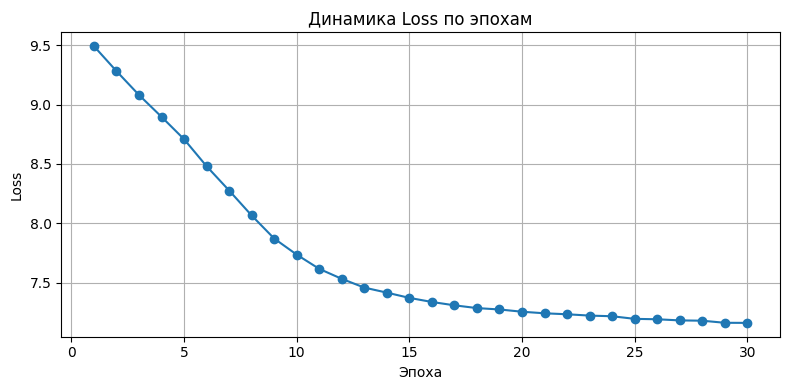

In [79]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
plt.plot(range(1, len(losses) + 1), losses, marker='o')
plt.title("Динамика Loss по эпохам")
plt.xlabel("Эпоха")
plt.ylabel("Loss")
plt.grid(True)
plt.tight_layout()
plt.show()

##сохранение весов модели

In [27]:
import pickle

delta_weights = {
    name: param.detach().cpu()
    for name, param in compiled_model.named_parameters()
    if "delta_W" in name
}

save_path = "fourier_adapter_weights.pt"
torch.save(delta_weights, save_path)
print(f"Адаптерные веса сохранены в: {save_path}")


Адаптерные веса сохранены в: fourier_adapter_weights.pt


In [86]:
model2 = AutoModelForTextToWaveform.from_pretrained("facebook/musicgen-melody")

model2.freeze_text_encoder()
model2.freeze_audio_encoder()

inject_fourierft(model2, n=5000, alpha=200.0, freq_bias="none")
freeze_all_except_fourier(model2)

print("\nПроверка вставленных delta_W:")
count = 0
for name, param in model2.named_parameters():
    if "delta_W" in name:
        print(f"{name} | norm: {param.norm().item():.6f}")
        count += 1

print(f"\nВсего вставлено delta_W: {count}")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

FourierFTWithBias вставлен в layer[0].self_attn.v_proj
FourierFTWithBias вставлен в layer[0].self_attn.q_proj
FourierFTWithBias вставлен в layer[1].self_attn.v_proj
FourierFTWithBias вставлен в layer[1].self_attn.q_proj
FourierFTWithBias вставлен в layer[2].self_attn.v_proj
FourierFTWithBias вставлен в layer[2].self_attn.q_proj
FourierFTWithBias вставлен в layer[3].self_attn.v_proj
FourierFTWithBias вставлен в layer[3].self_attn.q_proj
FourierFTWithBias вставлен в layer[4].self_attn.v_proj
FourierFTWithBias вставлен в layer[4].self_attn.q_proj
FourierFTWithBias вставлен в layer[5].self_attn.v_proj
FourierFTWithBias вставлен в layer[5].self_attn.q_proj
FourierFTWithBias вставлен в layer[6].self_attn.v_proj
FourierFTWithBias вставлен в layer[6].self_attn.q_proj
FourierFTWithBias вставлен в layer[7].self_attn.v_proj
FourierFTWithBias вставлен в layer[7].self_attn.q_proj
FourierFTWithBias вставлен в layer[8].self_attn.v_proj
FourierFTWithBias вставлен в layer[8].self_attn.q_proj
FourierFTW

In [87]:
import torch

delta_weights = torch.load("fourier_adapter_weights.pt", map_location="cpu")

applied, total = 0, 0
for name, param in model2.named_parameters():
    if "delta_W" in name:
        total += 1
        if name in delta_weights:
            with torch.no_grad():
                param.copy_(delta_weights[name].to(param.device))
            print(f"Применён: {name} | norm: {param.norm().item():.6f}")
            applied += 1
        else:
            print(f"Не найдено в сохранённых: {name}")

print(f"\nПрименено {applied}/{total} delta_W параметров")

Применён: decoder.model.decoder.layers.0.self_attn.v_proj.delta_W | norm: 61.551483
Применён: decoder.model.decoder.layers.0.self_attn.q_proj.delta_W | norm: 60.847649
Применён: decoder.model.decoder.layers.1.self_attn.v_proj.delta_W | norm: 60.848293
Применён: decoder.model.decoder.layers.1.self_attn.q_proj.delta_W | norm: 60.939331
Применён: decoder.model.decoder.layers.2.self_attn.v_proj.delta_W | norm: 61.717606
Применён: decoder.model.decoder.layers.2.self_attn.q_proj.delta_W | norm: 61.040096
Применён: decoder.model.decoder.layers.3.self_attn.v_proj.delta_W | norm: 60.967525
Применён: decoder.model.decoder.layers.3.self_attn.q_proj.delta_W | norm: 61.293636
Применён: decoder.model.decoder.layers.4.self_attn.v_proj.delta_W | norm: 61.393505
Применён: decoder.model.decoder.layers.4.self_attn.q_proj.delta_W | norm: 61.478855
Применён: decoder.model.decoder.layers.5.self_attn.v_proj.delta_W | norm: 60.709274
Применён: decoder.model.decoder.layers.5.self_attn.q_proj.delta_W | norm: 60

#dataset -> wav

In [35]:
from datasets import load_dataset, Audio
from pathlib import Path
import torchaudio

dataset_name = "artovv/musicgen-mystyle"
split = "train"
output_dir = Path("ref_chunks")
output_dir.mkdir(parents=True, exist_ok=True)

dataset = load_dataset(dataset_name, split=split, streaming=False)
dataset = dataset.cast_column("audio", Audio(sampling_rate=32000))

for idx, item in enumerate(dataset):
    audio = item["audio"]["array"]
    path = output_dir / f"chunk_{idx}.wav"
    torchaudio.save(str(path), torch.tensor(audio).unsqueeze(0), 32000)
    if idx % 10 == 0:
        print(f"Сохранено: {path}")


Сохранено: ref_chunks/chunk_0.wav
Сохранено: ref_chunks/chunk_10.wav
Сохранено: ref_chunks/chunk_20.wav
Сохранено: ref_chunks/chunk_30.wav
Сохранено: ref_chunks/chunk_40.wav
Сохранено: ref_chunks/chunk_50.wav
Сохранено: ref_chunks/chunk_60.wav


#оценка clap

In [40]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model.eval()

prompt = "my_style, 80s groovy dance-pop with drums and guitar"
output_dir = "./generated_test"
os.makedirs(output_dir, exist_ok=True)
guidance_scale = 3.0
num_tracks = 10


for i in range(num_tracks):
    print(f"\nГенерация трека {i + 1}/{num_tracks}")

    inputs = processor(text=[prompt], return_tensors="pt").to(device)

    with torch.no_grad():
        audio_values = model.generate(
            **inputs,
            do_sample=True,
            guidance_scale=guidance_scale,
            max_new_tokens=512
        )

    audio = audio_values.cpu().numpy().squeeze()
    path = os.path.join(output_dir, f"gen_{i + 1:02d}.wav")
    sf.write(path, audio, samplerate=32000)
    print(f"Сохранено: {path}")


    del audio_values, inputs
    torch.cuda.empty_cache()
    gc.collect()


Генерация трека 1/10
Сохранено: ./generated_test/gen_01.wav

Генерация трека 2/10
Сохранено: ./generated_test/gen_02.wav

Генерация трека 3/10
Сохранено: ./generated_test/gen_03.wav

Генерация трека 4/10
Сохранено: ./generated_test/gen_04.wav

Генерация трека 5/10
Сохранено: ./generated_test/gen_05.wav

Генерация трека 6/10
Сохранено: ./generated_test/gen_06.wav

Генерация трека 7/10
Сохранено: ./generated_test/gen_07.wav

Генерация трека 8/10
Сохранено: ./generated_test/gen_08.wav

Генерация трека 9/10
Сохранено: ./generated_test/gen_09.wav

Генерация трека 10/10
Сохранено: ./generated_test/gen_10.wav


 10%|█         | 1/10 [00:07<01:08,  7.61s/it]

gen_01.wav: средняя similarity = 0.6484


 20%|██        | 2/10 [00:16<01:05,  8.15s/it]

gen_02.wav: средняя similarity = 0.8083


 30%|███       | 3/10 [00:24<00:56,  8.04s/it]

gen_03.wav: средняя similarity = 0.7470


 40%|████      | 4/10 [00:32<00:48,  8.07s/it]

gen_04.wav: средняя similarity = 0.7243


 50%|█████     | 5/10 [00:40<00:41,  8.27s/it]

gen_05.wav: средняя similarity = 0.7719


 60%|██████    | 6/10 [00:48<00:32,  8.04s/it]

gen_06.wav: средняя similarity = 0.8915


 70%|███████   | 7/10 [00:56<00:24,  8.21s/it]

gen_07.wav: средняя similarity = 0.8216


 80%|████████  | 8/10 [01:05<00:16,  8.29s/it]

gen_08.wav: средняя similarity = 0.7774


 90%|█████████ | 9/10 [01:12<00:07,  7.99s/it]

gen_09.wav: средняя similarity = 0.7935


100%|██████████| 10/10 [01:21<00:00,  8.13s/it]

gen_10.wav: средняя similarity = 0.7458
📁 Сохранено: clap_full_pairwise.csv
Сохранено: clap_mean_similarity.csv


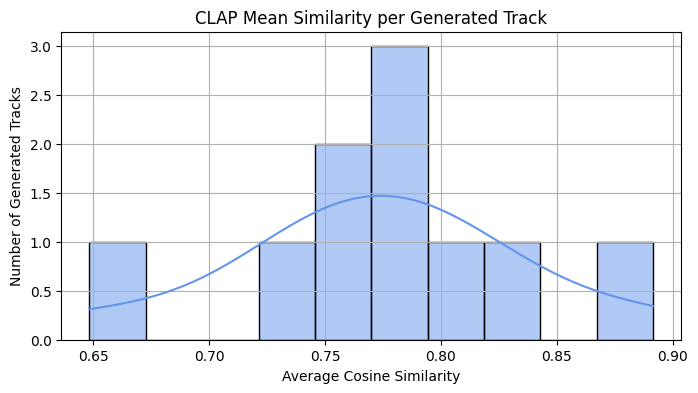

Среднее сходство по всем сгенерированным трекам: 0.7730


In [43]:
import os
import torch
import torchaudio
import numpy as np
import pandas as pd
from pathlib import Path
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import ClapProcessor, ClapModel
from sklearn.metrics.pairwise import cosine_similarity

device = "cuda" if torch.cuda.is_available() else "cpu"
model = ClapModel.from_pretrained("laion/clap-htsat-fused").to(device)
processor = ClapProcessor.from_pretrained("laion/clap-htsat-fused")

def load_audio(path, target_sr=48000, max_sec=5):
    waveform, sr = torchaudio.load(path)
    if sr != target_sr:
        resampler = torchaudio.transforms.Resample(sr, target_sr)
        waveform = resampler(waveform)
    max_len = target_sr * max_sec
    if waveform.shape[1] > max_len:
        waveform = waveform[:, :max_len]
    return waveform[0].unsqueeze(0)

def get_embedding(waveform):
    wav_np = waveform.cpu().numpy()
    inputs = processor(audios=wav_np, return_tensors="pt", sampling_rate=48000)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        emb = model.get_audio_features(**inputs)
    return emb.squeeze(0).cpu().numpy()

gen_dir = Path("generated_test")
ref_dir = Path("ref_chunks")
gen_paths = sorted(gen_dir.glob("*.wav"))
ref_paths = sorted(ref_dir.glob("*.wav"))

results = []

for gen_path in tqdm(gen_paths, desc=""):
    try:
        gen_wav = load_audio(gen_path)
        gen_emb = get_embedding(gen_wav)

        similarities = []
        for ref_path in ref_paths:
            try:
                ref_wav = load_audio(ref_path)
                ref_emb = get_embedding(ref_wav)
                sim = cosine_similarity([gen_emb], [ref_emb])[0][0]
                similarities.append(sim)
                results.append({
                    "generated": gen_path.name,
                    "reference": ref_path.name,
                    "similarity": sim
                })
            except Exception as e:
                print(f"Ошибка с reference {ref_path.name}: {e}")

        if similarities:
            avg_sim = sum(similarities) / len(similarities)
            print(f"{gen_path.name}: средняя similarity = {avg_sim:.4f}")

    except Exception as e:
        print(f"Ошибка с generated {gen_path.name}: {e}")

df = pd.DataFrame(results)
df.to_csv("clap_full_pairwise.csv", index=False)
print("📁 Сохранено: clap_full_pairwise.csv")


mean_df = df.groupby("generated")["similarity"].mean().reset_index()
mean_df.to_csv("clap_mean_similarity.csv", index=False)
print("Сохранено: clap_mean_similarity.csv")


plt.figure(figsize=(8, 4))
sns.histplot(mean_df["similarity"], bins=10, kde=True, color="cornflowerblue")
plt.title("CLAP Mean Similarity per Generated Track")
plt.xlabel("Average Cosine Similarity")
plt.ylabel("Number of Generated Tracks")
plt.grid(True)
plt.show()


print(f"Среднее сходство по всем сгенерированным трекам: {mean_df['similarity'].mean():.4f}")


Извлечение эмбеддингов CLAP для Diversity


100%|██████████| 10/10 [00:01<00:00,  6.86it/s]



Средняя косинусная схожесть между сгенерированными: 0.6907
CLAP Diversity Score: 0.3093


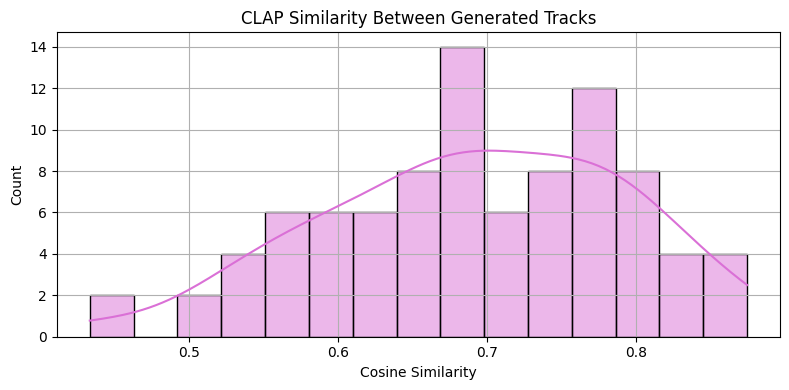

In [49]:
# 📦 Импорты
import torch
import torchaudio
import numpy as np
import pandas as pd
from pathlib import Path
from tqdm import tqdm
from transformers import ClapProcessor, ClapModel
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns

device = "cuda" if torch.cuda.is_available() else "cpu"
model = ClapModel.from_pretrained("laion/clap-htsat-fused").to(device)
processor = ClapProcessor.from_pretrained("laion/clap-htsat-fused")

gen_dir = Path("generated_test")
gen_paths = sorted(gen_dir.glob("*.wav"))
target_sr = 48000

def load_audio(path, max_sec=5):
    waveform, sr = torchaudio.load(path)
    if sr != target_sr:
        waveform = torchaudio.transforms.Resample(sr, target_sr)(waveform)
    max_len = target_sr * max_sec
    if waveform.shape[1] > max_len:
        waveform = waveform[:, :max_len]
    return waveform[0].unsqueeze(0)

def get_embedding(waveform):
    wav_np = waveform.cpu().numpy()
    inputs = processor(audios=wav_np, return_tensors="pt", sampling_rate=target_sr)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        emb = model.get_audio_features(**inputs)
    return emb.squeeze(0).cpu().numpy()

embeddings = []
print("Извлечение эмбеддингов CLAP для Diversity")
for path in tqdm(gen_paths):
    try:
        wav = load_audio(path)
        emb = get_embedding(wav)
        embeddings.append(emb)
    except Exception as e:
        print(f" {path.name}: {e}")

embeddings = np.stack(embeddings)
sim_matrix = cosine_similarity(embeddings)

mask = ~np.eye(len(sim_matrix), dtype=bool)
avg_sim = sim_matrix[mask].mean()
diversity_score = 1.0 - avg_sim

df_div = pd.DataFrame(sim_matrix, index=[p.name for p in gen_paths], columns=[p.name for p in gen_paths])
df_div.to_csv("clap_diversity_matrix.csv")

print(f"\nСредняя косинусная схожесть между сгенерированными: {avg_sim:.4f}")
print(f"CLAP Diversity Score: {diversity_score:.4f}")

plt.figure(figsize=(8, 4))
sns.histplot(sim_matrix[mask], bins=15, kde=True, color="orchid")
plt.title("CLAP Similarity Between Generated Tracks")
plt.xlabel("Cosine Similarity")
plt.ylabel("Count")
plt.grid(True)
plt.tight_layout()
plt.show()

